# Análisis de mercados bursátiles

## Índice de contenidos

1. Objetivos
    - Motivación 
    - Datasets seleccionados
1. Extracción y preprocesamiento de datos
1. Análisis exploratorio
1. Clusterización
1. Regresión y clasificación
1. Conclusiones

### 1. Objetivos

### 1.1 Motivación

El objetivo de este trabajo es crear un modelo para predecir el rendimiento que tendrán las empresas noveles en bolsa. Para ello, nos pondremos en la piel de unos gestores de una Hedge Fund especializada en inversiones en empresas que han salido a bolsa hace poco tiempo. 

Para llevar a cabo este modelo, necesitamos hacer un estudio de mercado sobre la situación promedio y el recorrido que han tenido las empresas que hacen una IPO (*Initial Public Offering*) para adquirir conocimientos aplicables a este subsector. Una vez tengamos una visión global de este, crearemos un modelo de clasificación para predecir si el próximo rendimiento trimestral de la acción de una empresa que salió a bolsa hace 1 año va a ser negativo, positivo o remarcable. 

Con esta predicción, lograremos separar las empresas cuyo rendimiento pudiera ser interesante de las que no ofrecerían, *a priori*, gran rentabilidad. Una vez que hayamos clasificado las empresas en base a su próxima evolución trimestral, seleccionaremos a las más prometedoras para realizar un estudio adicional: estimar la rentabilidad exacta esperada de estas.

Definimos las empresas más prometedoras como aquellas que obtienen una mayor probabilidad de ofrecer un rendimiento excepcional en el trimestre siguiente a su primer año cotizando en bolsa. Para ello, se generará un modelo LSTM individual para cada empresa en base a la variación de su cotización durante el último año, con el fin de predecir su variación final en los siguientes 3 meses.

### 1.2 Datasets

Hemos seleccionado dos datasets sobre IPOs:

#### [Startup Investments](https://www.kaggle.com/justinas/startup-investments?select=ipos.csv)

Este dataset contiene información sobre el recorrido que han realizado distintas empresas hasta llegar a su IPO. Dicha información nos permitirá obtener un conocimiento general sobre el proceso que sufre una empresa hasta su salida a bolsa. Algunas variables disponibles en este dataset son:

1. Número de empleados
2. Eventos remarcables en la historia de la empresa
3. Localización
4. Rondas de financiación


#### [Stocks IPO information & results](https://www.kaggle.com/proselotis/financial-ipo-data)

Este conjunto de datos ofrece información relativa al desempeño de la empresa durante su primer año en bolsa después de su salida a bolsa. Mediante esta información, crearemos los modelos de predicción que nos permitan discernir el rendimiento esperado del precio de una acción en el trimestre siguiente a su primer año en bolsa. Aunque este dataset sólo aporta datos del primer año de la empresa en bolsa, hemos obtenido los precios de las acciones 3 meses después empleando la librería `yfinance`. Un ejemplo de datos que podemos encontrar en este dataset son:

1. Número de días en los que la acción superó el rendimiento del S&P500
2. Año de fundación y fecha de IPO de la empresa
3. Ingresos y beneficio neto de la empresa

### 2. Extracción y preprocesamiento de datos

In [1]:
import warnings
warnings.filterwarnings('ignore')

In [2]:
!pip install exchange
# Kaggle no lo soporta
#!pip install yfinance

In [3]:
# Importar las librerías de Python necesarias para este notebook

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
import os
import exchange

from sklearn.preprocessing import LabelEncoder
from sklearn.neighbors import KNeighborsRegressor
from sklearn.cluster import KMeans
from mpl_toolkits.mplot3d import Axes3D

In [4]:
# Cargar ficheros
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/kaggle/input/startup-investments/funding_rounds.csv
/kaggle/input/startup-investments/milestones.csv
/kaggle/input/startup-investments/acquisitions.csv
/kaggle/input/startup-investments/ipos.csv
/kaggle/input/startup-investments/relationships.csv
/kaggle/input/startup-investments/objects.csv
/kaggle/input/startup-investments/offices.csv
/kaggle/input/startup-investments/people.csv
/kaggle/input/startup-investments/degrees.csv
/kaggle/input/startup-investments/investments.csv
/kaggle/input/startup-investments/funds.csv
/kaggle/input/financial-ipo-data/IPODataFull.csv


# 1 - Extracción y limpieza de datos

En este apartado se lleva a cabo el proceso de extracción y limpieza. Los datos se encuentran separados en distintos datasets, por tanto, se deben hacer múltiples extracciones.


## 1.1 Stocks IPO information & results

Este dataset contiene información sobre las acciones estadounidenses de empresas (antes de cotizar en bolsa), información como el número de empleados, la ubicación de la sede, cuándo la empresa declara un mes fiscal, metadatos sobre la propiedad y más. Por supuesto, no podría validar los resultados de ninguna predicción sin los resultados del stock. Por lo tanto, el primer año fiscal después de salir a bolsa contiene datos (incluidos la apertura, el cierre, el volumen y el máximo de cada día).

In [5]:
# Cargar fichero objects
objects = pd.read_csv('/kaggle/input/startup-investments/objects.csv')

# Crear dataset de compañías
companies = objects[objects['entity_type'] == "Company"]

In [6]:
# Seleccionar columnas relevantes
companies = companies[['id','normalized_name','category_code','status', 
                    'country_code', 'state_code', 'city', 'region','milestones', 'founded_at']]

companies.head()

,id,normalized_name,category_code,status,country_code,state_code,city,region,milestones,founded_at
0,c:1,wetpaint,web,operating,USA,WA,Seattle,Seattle,5,2005-10-17
1,c:10,flektor,games_video,acquired,USA,CA,Culver City,Los Angeles,0,NaN
2,c:100,there,games_video,acquired,USA,CA,San Mateo,SF Bay,4,NaN
3,c:10000,mywebbo,network_hosting,operating,NaN,NaN,NaN,unknown,0,2008-07-26
4,c:10001,the movie streamer,games_video,operating,NaN,NaN,NaN,unknown,0,2008-07-26


In [7]:
# Cargar fichero de relaciones [Compañía - Empleado]
relationships = pd.read_csv('/kaggle/input/startup-investments/relationships.csv')

# Agrupar por compañía haciendo un conteo del número de empleados
relationships = relationships.groupby('relationship_object_id')['relationship_object_id'].count().reset_index(name='employees')

# Renombrar columna para hacer merge
relationships = relationships.rename(columns = {"relationship_object_id":"id"})

# Añadir el número de empleados a la compañía
companies = pd.merge(companies, relationships, how="left", on=["id"])

companies['employees'] = companies['employees'].fillna(0)

# Visualizar dataset resultante
companies.head()

,id,normalized_name,category_code,status,country_code,state_code,city,region,milestones,founded_at,employees
0,c:1,wetpaint,web,operating,USA,WA,Seattle,Seattle,5,2005-10-17,17.0
1,c:10,flektor,games_video,acquired,USA,CA,Culver City,Los Angeles,0,NaN,6.0
2,c:100,there,games_video,acquired,USA,CA,San Mateo,SF Bay,4,NaN,12.0
3,c:10000,mywebbo,network_hosting,operating,NaN,NaN,NaN,unknown,0,2008-07-26,0.0
4,c:10001,the movie streamer,games_video,operating,NaN,NaN,NaN,unknown,0,2008-07-26,0.0


In [8]:
investments = pd.read_csv('/kaggle/input/startup-investments/investments.csv')
investments.head()

,id,funding_round_id,funded_object_id,investor_object_id,created_at,updated_at
0,1,1,c:4,f:1,2007-07-04 04:52:57,2008-02-27 23:14:29
1,2,1,c:4,f:2,2007-07-04 04:52:57,2008-02-27 23:14:29
2,3,3,c:5,f:4,2007-05-27 06:09:10,2013-06-28 20:07:23
3,4,4,c:5,f:1,2007-05-27 06:09:36,2013-06-28 20:07:24
4,5,4,c:5,f:5,2007-05-27 06:09:36,2013-06-28 20:07:24


In [9]:
# Seleccionar columnas relevantes
investments = investments[['investor_object_id','funded_object_id']]

# Renombrar columnas
investments = investments.rename(columns={"investor_object_id": "object_id"})

# Agrupar por compañía haciendo un conteo del número de empleados
investments = investments.groupby(['object_id'])['funded_object_id'].count().reset_index(name='count_investments')

# Renombrar columna para hacer merge
investments = investments.rename(columns = {"object_id":"id"})

# Visualizar dataset resultante
investments.head()

,id,count_investments
0,c:10020,1
1,c:10022,3
2,c:10071,1
3,c:10085,1
4,c:100936,1


In [10]:
# Unir datasets por clave
companies = pd.merge(companies, investments, how="left", on=["id"])

# Sustituir nan por 0
companies['count_investments'] = companies['count_investments'].fillna(0)

In [11]:
# Cargar fichero de adquisiciones
acquisitions = pd.read_csv('/kaggle/input/startup-investments/acquisitions.csv')

# Seleccionar columnas relevantes
acquisitions = acquisitions[['acquiring_object_id','acquired_object_id','price_amount',
                    'price_currency_code', 'acquired_at']]

# Renombrar columnas
acquisitions = acquisitions.rename(columns={"acquiring_object_id": "object_id"})

# Agrupar por compañía haciendo un conteo del número de empleados
acquisitions = acquisitions.groupby(['object_id', 'price_currency_code'])['price_amount'].sum().reset_index(name='price_amount')

# Renombrar columna para hacer merge
acquisitions = acquisitions.rename(columns = {"object_id":"id"})

# Agrupar adquisiciones por empresa
acquisitions = acquisitions.groupby('price_currency_code')

# Visualizar dataset resultante
acquisitions.head()

,id,price_currency_code,price_amount
0,c:10014,USD,0.0
1,c:100331,USD,0.0
2,c:10066,USD,0.0
3,c:10069,USD,51500000.0
4,c:100704,USD,0.0
24,c:102577,GBP,11000000.0
29,c:10309,EUR,4100000.0
63,c:106206,EUR,0.0
75,c:108,GBP,18500000.0
136,c:120284,EUR,0.0


In [12]:
exchange_rate_CAD = float(exchange.rate('CAD', 'USD'))
exchange_rate_GBP = float(exchange.rate('GBP', 'USD'))
exchange_rate_JPY = float(exchange.rate('JPY', 'USD'))

def price_amount_USD(data):

    if data['price_currency_code'] == 'CAD':
        price_amount_USD = data['price_amount'] * exchange_rate_CAD
    elif data['price_currency_code'] == 'GBP':
        price_amount_USD = data['price_amount'] * exchange_rate_GBP
    elif data['price_currency_code'] == 'JPY':
        price_amount_USD = data['price_amount'] * exchange_rate_JPY
    else:
        price_amount_USD = data['price_amount']

    return round(price_amount_USD,0)

In [13]:
acquisitions = acquisitions.apply(lambda x: x)
acquisitions['acquirements'] = acquisitions.apply(price_amount_USD, axis=1)
acquisitions = acquisitions[['id', 'acquirements', 'price_currency_code']]
acquisitions

,id,acquirements,price_currency_code
0,c:10014,0.0,USD
1,c:100331,0.0,USD
2,c:10066,0.0,USD
3,c:10069,51500000.0,USD
4,c:100704,0.0,USD
...,...,...,...
4920,c:9931,28000000.0,USD
4921,c:9947,0.0,USD
4922,c:9952,158000000.0,USD
4923,c:9992,0.0,USD


In [14]:
companies = pd.merge(companies, acquisitions, how="left", on=["id"])
companies['acquirements'] = companies['acquirements'].fillna(0)

* **id**: Identificador de la compañía
* **normalized_name**: Nombre de la compañía
* **category_code**: Código de la categoría a la que pertenece
* **status**: Estado en el que se encuentra (operating, acquired, closed, ipo)
* **country_code**: Código del pais al que pertenece
* **state_code**: Código del estado al que pertenece
* **city**:  Ciudad a la que pertenece
* **region**: Región a la que pertenece
* **milestones**: Número de noticias generadas (Premios, noticias, lanzamientos... )
* **employees**: Número de empleados
* **acquirements**: Dinero empleado en adquisiciones
* **count_investments**: Número de inversiones

In [15]:
# Análisis del dataset

companies = companies.dropna(0,how='all') # Eliminar filas vacías, si las hay
companies = companies.dropna(subset=['id', 'normalized_name', 'category_code']) # Eliminar filas con valores nulos en columnas relevantes

print('Dimensiones: ', companies.shape) # Obtener dimensiones del dataset (filas, columnas)
companies.describe(include=['object'])

Dimensiones:  (123237, 14)


,id,normalized_name,category_code,status,country_code,state_code,city,region,founded_at,price_currency_code
count,123237,123237,123237,123237,81267,46676,77493,123237,88361,3967
unique,123186,122810,42,4,173,51,10209,5624,6119,7
top,c:59,internet,software,operating,USA,CA,New York,unknown,2011-01-01,USD
freq,3,4,17928,113090,47345,15293,3543,43185,3617,3858


Observamos que el número de filas se corresponde con el número de ids únicos y nombres, por tanto, podemos confirmar que en este dataset no existen compañías duplicadas.

Las compañías estan divididas en 42 categorías, de las cuales, Software es la más frecuente. 
Las compañías pueden estar en 4 estados (operating, acquired, closed, ipo), el más frecuente es operating.  
El dataset contiene información de compañías de 147 paises. El país del cual hay más compañías es USA.

Todas las columnas son strings excepto el número de milestones y empleados, que son de tipo numérico. Esto supone un problema puesto que los modelos no siempre pueden trabajar con datos de tipo categorico. Para solucionarlo empleamos la técnica de One Hot Encoding a partir de la cual se obtiene una codificación de características categóricas como una matriz numérica.

## 1.x Matriz de correlación

La matriz de correlación es un dato tabular que representa las correlaciones entre pares de variables en un dato dado. Cada fila y columna representa una variable, y cada valor de esta matriz es el coeficiente de correlación entre las variables representadas por la fila y columna correspondientes.

La matriz de correlación es una importante métrica de análisis de datos que se calcula para resumir los datos a fin de comprender la relación entre las diversas variables y tomar decisiones en consecuencia.

También es un importante paso de preprocesamiento en aprendizaje automático cuando se desea reducir la dimensionalidad de un dato de alta dimensión.

La interpretación, es sencilla: cada fila representa una variable, y todas las columnas representan las mismas variables que las filas, de ahí el número de filas sea igual que el número de columnas.

El valor de cada casilla representa la correlación entre pares de variables:

* Un valor positivo grande (cercano a 1,0) indica una fuerte correlación positiva, es decir, si el valor de una de las variables aumenta, el valor de la otra variable aumenta también.

* Un valor negativo grande (cercano a -1,0) indica una fuerte correlación negativa, es decir, que el valor de una de las variables disminuye al aumentar el de la otra y viceversa.
* Un valor cercano a 0 (tanto positivo como negativo) indica la ausencia de cualquier correlación entre las dos variables, y por lo tanto esas variables son independientes entre sí.

In [16]:
def get_binary_status(data):

    status_operating = False
    status_acquired = False
    status_closed = False
    status_ipo = False

    if data['status'] == 'operating':
        status_operating = True
    elif data['status'] == 'acquired':
        status_acquired = True
    elif data['status'] == 'closed':
        status_closed = True
    elif data['status'] == 'ipo':
        status_ipo = True

    return pd.Series([status_operating, status_acquired, status_closed, status_ipo])

In [17]:
companies_status = companies.copy()
companies_status[['status_operating','status_acquired','status_closed','status_ipo']] = companies.apply(get_binary_status, axis=1)
companies_status.head()

,id,normalized_name,category_code,status,country_code,state_code,city,region,milestones,founded_at,employees,count_investments,acquirements,price_currency_code,status_operating,status_acquired,status_closed,status_ipo
0,c:1,wetpaint,web,operating,USA,WA,Seattle,Seattle,5,2005-10-17,17.0,0.0,0.0,NaN,True,False,False,False
1,c:10,flektor,games_video,acquired,USA,CA,Culver City,Los Angeles,0,NaN,6.0,0.0,0.0,NaN,False,True,False,False
2,c:100,there,games_video,acquired,USA,CA,San Mateo,SF Bay,4,NaN,12.0,0.0,0.0,NaN,False,True,False,False
3,c:10000,mywebbo,network_hosting,operating,NaN,NaN,NaN,unknown,0,2008-07-26,0.0,0.0,0.0,NaN,True,False,False,False
4,c:10001,the movie streamer,games_video,operating,NaN,NaN,NaN,unknown,0,2008-07-26,0.0,0.0,0.0,NaN,True,False,False,False


In [18]:
services = ['biotech', 'hospitality', 'pets', 'medical', 'health', 'education',
            'security', 'government', 'travel', 'nonprofit', 'public_relations']

technology = ['web', 'games_video', 'network_hosting', 'cleantech', 'software', 'search', 'social', 'news', 'messaging','nanotech', 
             'photo_video','music']

business = ['advertising', 'enterprise', 'consulting', 'analytics', 'ecommerce', 'finance', 'legal']

manufacturing = ['mobile', 'manufacturing', 'design', 'hardware', 'automotive', 'sports', 'transportation', 
                'fashion', 'real_estate',  'semiconductor', 'local']

other = ['other']

In [19]:
def get_binary_category(data):
    category_services = False
    category_technology = False
    category_business = False
    category_manufacturing = False
    category_other = False
    category_name = ""

    if data['category_code'] in services:
        category_services = True
        category_name = "services"
    elif data['category_code'] in technology:
        category_technology = True 
        category_name = "technology"

    elif data['category_code'] in business:
        category_business = True
        category_name = "business"

    elif data['category_code'] in manufacturing:
        category_manufacturing = True
        category_name = "manufacturing"

    elif data['category_code'] in other:
        category_other = True
        category_name = "other"


    return pd.Series([category_name,category_services,category_technology,category_business,category_manufacturing,category_other])

In [20]:
companies_status = companies_status.copy()
companies_status[['category_name', 'category_services','category_technology','category_business','category_manufacturing','category_other']] = companies.apply(get_binary_category, axis=1)
companies_status.head()

,id,normalized_name,category_code,status,country_code,state_code,city,region,milestones,founded_at,...,status_operating,status_acquired,status_closed,status_ipo,category_name,category_services,category_technology,category_business,category_manufacturing,category_other
0,c:1,wetpaint,web,operating,USA,WA,Seattle,Seattle,5,2005-10-17,...,True,False,False,False,technology,False,True,False,False,False
1,c:10,flektor,games_video,acquired,USA,CA,Culver City,Los Angeles,0,NaN,...,False,True,False,False,technology,False,True,False,False,False
2,c:100,there,games_video,acquired,USA,CA,San Mateo,SF Bay,4,NaN,...,False,True,False,False,technology,False,True,False,False,False
3,c:10000,mywebbo,network_hosting,operating,NaN,NaN,NaN,unknown,0,2008-07-26,...,True,False,False,False,technology,False,True,False,False,False
4,c:10001,the movie streamer,games_video,operating,NaN,NaN,NaN,unknown,0,2008-07-26,...,True,False,False,False,technology,False,True,False,False,False


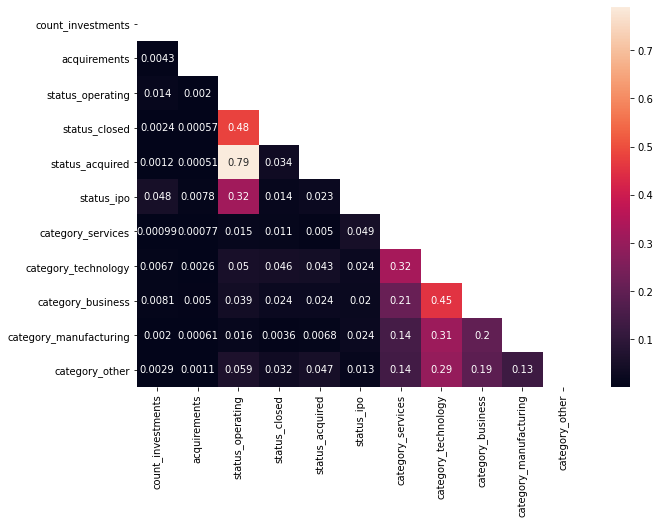

In [21]:
mat = companies_status[['category_name','count_investments', 'acquirements', 'status_operating', 'status_closed',
                        'status_acquired', 'status_ipo', 'category_services','category_technology',
                        'category_business', 'category_manufacturing', 'category_other']].corr().abs()

mask = np.triu(np.ones_like(mat, dtype=bool))
mat_masked = mat.mask(mask)  # Pone a NaN todo lo que aparezca como True en la máscara

fig, ax = plt.subplots(figsize=(10,7)) 
sns.heatmap(mat_masked, annot=True, ax=ax)
plt.show()

Como se puede observar en esta última matriz de correlación, tanto las adquisiciones como el número de inversiones se relacionan de forma inversa con los estados 'acquired' e 'ipo'. Esto nos da información acerca de la lógica incluida en el dataset, cuando una empresa adquiere a otra, la primera pasa a estar en estado 'ipo' y la segunda en 'acquired'. Las compañías en estado 'operating' o 'closed' no tienen información de adquisiciones o inversiones y, por tanto, podemos identificarlas como compañías que realizan su actividad de forma independiente, es decir, no perteneciendo a ningún grupo de inversión (o al menos que conste en este dataset).

También podemos asumir que no se pueden inferir relaciones de "tercer grado" a partir del estado, es decir, no podemos identificar compañías que adquieran otras y, estas a su vez, que adquieran otras distintas. Nos hacemos a la idea de que todas las empresas 'acquired' van a depender directamente de una empresa en estado 'ipo'.

In [22]:
def get_acquirements_per_country(data):

    acquariments_USA = 0
    acquariments_OTHERS = 0

    if data['country_code'] == 'USA':
        acquariments_USA = data['acquirements']
    else:
        acquariments_OTHERS = data['acquirements']

    return pd.Series([acquariments_USA, acquariments_OTHERS])

In [23]:
companies_status[['acquirements_USA','acquirements_OTHERS']] = companies_status.apply(get_acquirements_per_country, axis=1)
companies_status.head()

,id,normalized_name,category_code,status,country_code,state_code,city,region,milestones,founded_at,...,status_closed,status_ipo,category_name,category_services,category_technology,category_business,category_manufacturing,category_other,acquirements_USA,acquirements_OTHERS
0,c:1,wetpaint,web,operating,USA,WA,Seattle,Seattle,5,2005-10-17,...,False,False,technology,False,True,False,False,False,0.0,0.0
1,c:10,flektor,games_video,acquired,USA,CA,Culver City,Los Angeles,0,NaN,...,False,False,technology,False,True,False,False,False,0.0,0.0
2,c:100,there,games_video,acquired,USA,CA,San Mateo,SF Bay,4,NaN,...,False,False,technology,False,True,False,False,False,0.0,0.0
3,c:10000,mywebbo,network_hosting,operating,NaN,NaN,NaN,unknown,0,2008-07-26,...,False,False,technology,False,True,False,False,False,0.0,0.0
4,c:10001,the movie streamer,games_video,operating,NaN,NaN,NaN,unknown,0,2008-07-26,...,False,False,technology,False,True,False,False,False,0.0,0.0


## 1.x Integramos los dos datasets

Extraemos los códigos que representan a las empresas de ambos conjuntos de datos: IPODataFull.csv e ipos.csv 

In [24]:
ipos = pd.read_csv('/kaggle/input/startup-investments/ipos.csv')
ipos.head()

,id,ipo_id,object_id,valuation_amount,valuation_currency_code,raised_amount,raised_currency_code,public_at,stock_symbol,source_url,source_description,created_at,updated_at
0,1,1,c:1654,0.000000e+00,USD,0.0,USD,1980-12-19,NASDAQ:AAPL,NaN,NaN,2008-02-09 05:17:45,2012-04-12 04:02:59
1,2,2,c:1242,0.000000e+00,USD,0.0,NaN,1986-03-13,NASDAQ:MSFT,NaN,NaN,2008-02-09 05:25:18,2010-12-11 12:39:46
2,3,3,c:342,0.000000e+00,USD,0.0,NaN,1969-06-09,NYSE:DIS,NaN,NaN,2008-02-09 05:40:32,2010-12-23 08:58:16
3,4,4,c:59,0.000000e+00,USD,0.0,NaN,2004-08-25,NASDAQ:GOOG,NaN,NaN,2008-02-10 22:51:24,2011-08-01 20:47:08
4,5,5,c:317,1.000000e+11,USD,0.0,NaN,1997-05-01,NASDAQ:AMZN,NaN,NaN,2008-02-10 23:28:09,2011-08-01 21:11:22


In [25]:
ipodata = pd.read_csv('/kaggle/input/financial-ipo-data/IPODataFull.csv', encoding='iso-8859-1')
ipodata = ipodata[['Symbol', 'Year']]

En el fichero IPODataFull.csv tenemos datos del NASDAQ (National Association of Securities Dealers Automated Quotation), mercado caracterizado por comprender empresas de alta tecnología en electrónica, informática, telecomunicaciones, biotecnología, entre otras.

Por otro lado, un segundo conjunto de datos, del que forma parte el archivo ipos.csv, contiene información sobre las IPOs (Initial Public Offer) a nivel mundial. Una IPO se define como la oferta inicial al público de las acciones de una empresa en su salida a bolsa. 

Por tanto, para unificar ambos conjuntos, vamos a restringir la información al ámbito del NASDAQ.

In [26]:
NASDAQ_ipos = ipos[ipos['stock_symbol'].str.contains('NASDAQ:')]
NASDAQ_ipos['stock_symbol'] = NASDAQ_ipos['stock_symbol'].str.slice(start=7).str.strip()
NASDAQ_ipos = NASDAQ_ipos[['object_id', 'stock_symbol']]
NASDAQ_ipos = NASDAQ_ipos.rename(columns={"stock_symbol": "Symbol"})
NASDAQ_ipos.head()

,object_id,Symbol
0,c:1654,AAPL
1,c:1242,MSFT
3,c:59,GOOG
4,c:317,AMZN
9,c:3316,BMC


In [27]:
full_data = pd.merge(ipodata, NASDAQ_ipos, how="inner", on=["Symbol"])
full_data = full_data.rename(columns={"object_id": "id"})
full_data.head()

,Symbol,Year,id
0,ACAD,2004,c:65949
1,ACHN,2006,c:32658
2,ACLS,2000,c:149998
3,ACOR,2006,c:81002
4,ACTG,2002,c:39172


In [28]:
def get_acquirements_per_year(data):
    return data['acquirements'] / data['Year_Diff'] if data['Year_Diff'] > 0 else 0

In [29]:
companies_NASDAQ_IPO = pd.merge(companies_status, full_data, how="inner", on=["id"])
companies_NASDAQ_IPO['Year_Diff'] = 2021 - companies_NASDAQ_IPO['Year'] 
companies_NASDAQ_IPO['acq_per_year'] = companies_NASDAQ_IPO.apply(get_acquirements_per_year, axis=1)
companies_NASDAQ_IPO.to_csv('companies_NASDAQ_IPO.csv')
companies_NASDAQ_IPO.head()

,id,normalized_name,category_code,status,country_code,state_code,city,region,milestones,founded_at,...,category_technology,category_business,category_manufacturing,category_other,acquirements_USA,acquirements_OTHERS,Symbol,Year,Year_Diff,acq_per_year
0,c:10855,teletech,software,acquired,USA,CO,Englewood,Denver,1,1982-01-01,...,True,False,False,False,0.0,0.0,TTEC,1996,25,0.000000e+00
1,c:1105,wix,web,ipo,ISR,NaN,Tel Aviv,Tel Aviv,4,2006-01-01,...,True,False,False,False,0.0,0.0,WIX,2013,8,0.000000e+00
2,c:11082,f5 networks,other,ipo,USA,WA,Seattle,Seattle,2,1996-02-01,...,False,False,False,True,210000000.0,0.0,FFIV,1999,22,9.545455e+06
3,c:11391,groupon,web,ipo,USA,IL,Chicago,Chicago,3,2008-11-11,...,True,False,False,False,272700000.0,0.0,GRPN,2011,10,2.727000e+07
4,c:12394,commscope,hardware,ipo,USA,TX,Richardson,Dallas,2,1976-01-01,...,False,False,True,False,60000000.0,0.0,COMM,2013,8,7.500000e+06


##  1.x Oficinas
A continuación se va a cargar y preprocesar el dataset offices. Este dataset cuenta con información geográfica de las oficinas que tiene cada empresa, (ciudad, región, pais, código postal, latitud, longitud, etc.). Además, también contiene alguna información relacionada con las oficinas, como el número de empleados o la fecha en la que se inaguraron. 

In [30]:
oficinas = pd.read_csv('../input/startup-investments/offices.csv',index_col='id')
oficinas

,object_id,office_id,description,region,address1,address2,city,zip_code,state_code,country_code,latitude,longitude,created_at,updated_at
id,,,,,,,,,,,,,,
1,c:1,1,NaN,Seattle,710 - 2nd Avenue,Suite 1100,Seattle,98104,WA,USA,47.603122,-122.333253,NaN,NaN
2,c:3,3,Headquarters,SF Bay,4900 Hopyard Rd,Suite 310,Pleasanton,94588,CA,USA,37.692934,-121.904945,NaN,NaN
3,c:4,4,NaN,SF Bay,135 Mississippi St,NaN,San Francisco,94107,CA,USA,37.764726,-122.394523,NaN,NaN
4,c:5,5,Headquarters,SF Bay,1601 Willow Road,NaN,Menlo Park,94025,CA,USA,37.416050,-122.151801,NaN,NaN
5,c:7,7,NaN,SF Bay,Suite 200,654 High Street,Palo Alto,94301,CA,ISR,0.000000,0.000000,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
112714,f:15098,127846,NaN,New York,8 Sound Shore Drive,Suite 303,Greenwich,06830,CT,USA,0.000000,0.000000,NaN,NaN
112715,c:286200,127847,NaN,Santa Barbara,735 State Street,Suite 500,Santa Barbara,93101,CA,USA,0.000000,0.000000,NaN,NaN
112716,c:256895,127848,NaN,Los Angeles,"5777 W. Century Blvd., Suite 360",NaN,Los Angeles,90045,CA,USA,0.000000,0.000000,NaN,NaN


In [31]:
# Imprimimos alguna informción de este dataset
print("Número de empresas con oficinas: ", 
    len(oficinas["object_id"].unique()))

print("Número total de oficinas: ", 
    len(oficinas["object_id"].dropna()))



Número de empresas con oficinas:  95043
Número total de oficinas:  112718


In [32]:
# created_at y updated_at no contienen datos
# eliminamos estas columnas
oficinas.drop(columns=['created_at', 'updated_at'], inplace=True)
oficinas.head()

,object_id,office_id,description,region,address1,address2,city,zip_code,state_code,country_code,latitude,longitude
id,,,,,,,,,,,,
1,c:1,1,NaN,Seattle,710 - 2nd Avenue,Suite 1100,Seattle,98104,WA,USA,47.603122,-122.333253
2,c:3,3,Headquarters,SF Bay,4900 Hopyard Rd,Suite 310,Pleasanton,94588,CA,USA,37.692934,-121.904945
3,c:4,4,NaN,SF Bay,135 Mississippi St,NaN,San Francisco,94107,CA,USA,37.764726,-122.394523
4,c:5,5,Headquarters,SF Bay,1601 Willow Road,NaN,Menlo Park,94025,CA,USA,37.416050,-122.151801
5,c:7,7,NaN,SF Bay,Suite 200,654 High Street,Palo Alto,94301,CA,ISR,0.000000,0.000000


In [33]:
# Cambiamos nan en description
# Evitamos errores a la hora de graficar
oficinas['description'].fillna('None', inplace=True)
oficinas['city'].fillna('None', inplace=True)

In [34]:
# Combinamos address1 y addres2
oficinas["address"] = oficinas["address1"].fillna('None') + \
     oficinas['address2'].fillna(' ')

oficinas.drop(columns=["address1", "address2"], inplace=True)

In [35]:
# Cambio nombres de algunas columnas 
# Estos nombres salen en las gráficas
oficinas.rename(columns={
    "description": "Descripción",
    "address": "Dirección",
    "object_id": "ID",
    'latitude': "Latitud",
    "longitude": "Longitud"
    }, inplace=True)

# 3. Análisis exploratorio

En este apartado se realizan ciertas gráficas con las datos cargados en el apartado anterior. 
A continuación se muestra un mapa donde cada punto rojo corresponde con una oficina dentro del conjunto de datos. Seleccionando en el mapa cada punto rojo podemos obtener cierta información, como su posición geográfica exacta, el ID de la empresa a la que pertenece la oficina o una pequña decripcion. 

In [36]:
fig = px.scatter_mapbox(
    oficinas,
    lat="Latitud",
    lon="Longitud",
    zoom=3,
    height=300,
    hover_name="city",
    color_discrete_sequence=["red"],
    hover_data={"Descripción", "Dirección", "ID"}
)

fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

A continuación graficamos alguna información sobre las compañías de las que disponemos datos. 

In [37]:
df = companies_NASDAQ_IPO.copy()

Veamos a qué sector pertenecen las empresas de las que tenemos información.

In [38]:
# Pie plot 
aux = df['category_code'].value_counts()
aux = pd.DataFrame([aux.index, aux]).transpose()
aux.columns = ['Sector', 'Recuento']
aux['Sector'] = aux['Sector'].str.title().str.replace('_', ' ')
fig = px.pie(aux, values='Recuento', names='Sector',
       title='Porcentaje de empresas que pertenecen a cada sector')
fig.show()

Vemos que la mayoría de empresas pertenecen al sector de la biotecnologia, seguido por los sectores de hardware y software.

A continuación graficamos el número de empleados que tiene cada empresa. 

In [39]:
aux = df.loc[:,('normalized_name', 'employees')]
aux.rename(columns={'normalized_name': 'Nombre',
           'employees': 'Empleados'}, inplace=True)
aux['Nombre'] = aux['Nombre'].str.title()
fig = px.scatter(aux, x='Nombre', y='Empleados', title='Número de empleados de cada empresa')
fig.show()

Vemos que la empresa que más empleados tiene, es con diferencia Google. Seguida a Google tenemos a Ebay, Facebook y Amazón. Ampliando el gráfico podemos ver que la mayoría de empresas tienen menos de 50 empleados.

A continuación mostramos el año de fundación de cada empresa. 

In [40]:
aux = df.loc[:,('normalized_name', 'Year')]
aux.rename(columns={'normalized_name': 'Nombre',
           'Year': 'Año de fundación'}, inplace=True)
aux['Nombre'] = aux['Nombre'].str.title()
fig = px.scatter(aux, x='Año de fundación', y='Nombre', title='Año de fundación de cada empresa')
fig.show()

En la siguiente imágen podemos ver las adquisiciones que ha realizado cada empresa. La diferencia de adquisicoines es tan grande en algunas empresas que es necesario ampliar el gráfico para poder ver los resultados claramente. 

In [41]:
aux = df.loc[:,('normalized_name', 'acquirements')]
aux = aux[aux['acquirements']>0]
aux.rename(columns={'normalized_name': 'Nombre',
           'acquirements': 'Adquisiciones'}, inplace=True)
aux['Nombre'] = aux['Nombre'].str.title()
fig = px.scatter(aux, x='Nombre', y='Adquisiciones', title='Adquisiciones de cada empresa')
fig.show()


# 4. Clustering
En este apartado aplicaremos una estrategia de clustering al conjunto de datos con el objetivo de descubrir nuevas relaciones entre las columnas.

Para ello emplearemos el algoritmo Kmeans el cual trabaja iterativamente para asignar a cada muestra uno de los “K” grupos basado en sus características. Son agrupados en base a la similitud de sus columnas.

Los grupos se van definiendo de manera “orgánica”, es decir que se va ajustando su posición en cada iteración del proceso, hasta que converge el algoritmo. Una vez hallados los centroides debemos analizarlos para ver cuales son sus características únicas, frente a la de los otros grupos. Estos grupos son las etiquetas que genera el algoritmo.

Para reducir la complejidad del problema reduciremos el número de columnas del dataset.

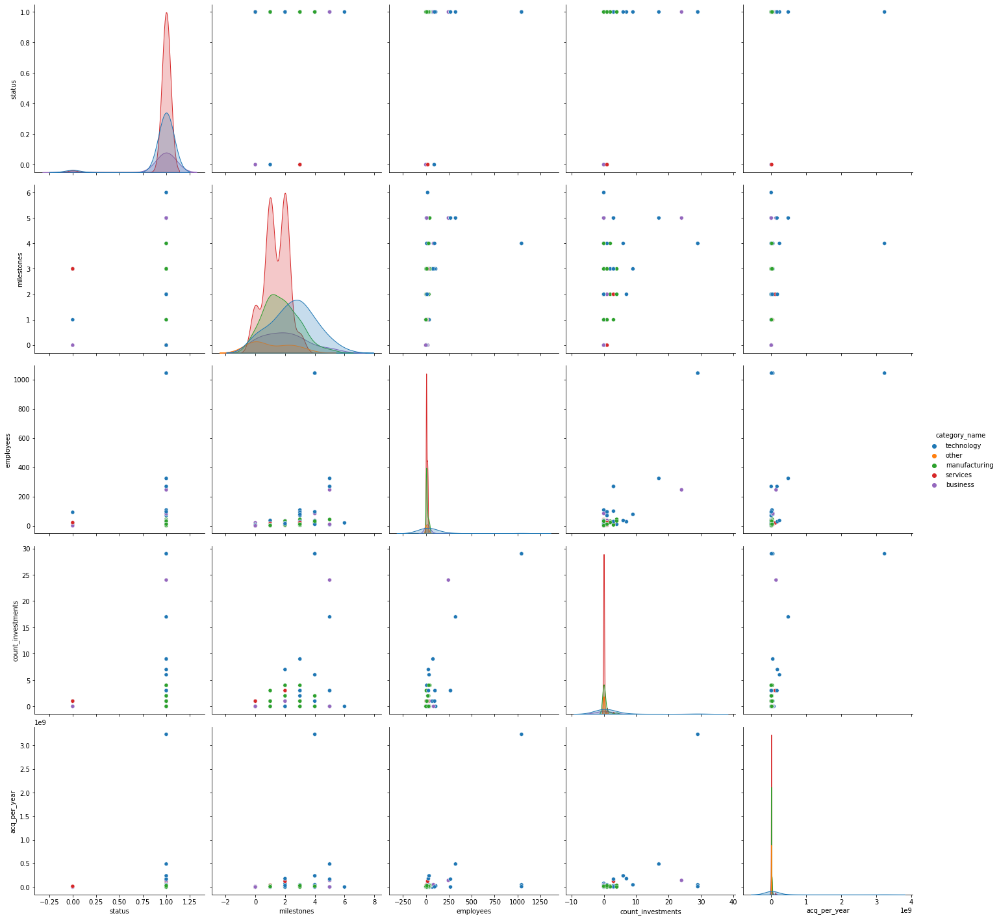

In [42]:
# Crear instancia del encoder
labelencoder = LabelEncoder()

clustering_dataset = companies_NASDAQ_IPO.copy()
clustering_dataset['status'] = labelencoder.fit_transform(companies_NASDAQ_IPO['status'])

sns.pairplot(clustering_dataset, hue='category_name',size=4,vars=["status", "milestones", "employees","count_investments","acq_per_year"],kind='scatter')

# Posibles outliers

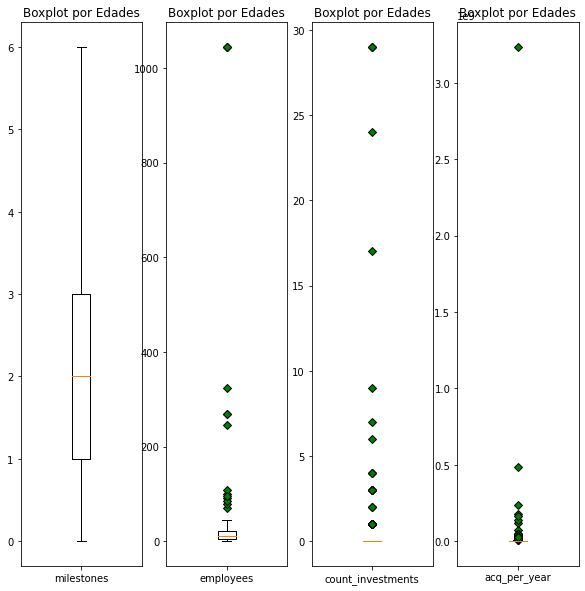

In [43]:
green_diamond = dict(markerfacecolor='g', marker='D')

fig, axs = plt.subplots(1, 4, figsize=(10,10))

axs[0].set_title('Boxplot por Edades')
axs[0].boxplot(clustering_dataset["milestones"], flierprops=green_diamond, labels=["milestones"])
axs[1].set_title('Boxplot por Edades')
axs[1].boxplot(clustering_dataset["employees"], flierprops=green_diamond, labels=["employees"])
axs[2].set_title('Boxplot por Edades')
axs[2].boxplot(clustering_dataset["count_investments"], flierprops=green_diamond, labels=["count_investments"])
axs[3].set_title('Boxplot por Edades')
axs[3].boxplot(clustering_dataset["acq_per_year"], flierprops=green_diamond, labels=["acq_per_year"])

fig.show()

Para seleccionar el número de clusters empleamos la regla del codo, la cual determina que el número óptimo de clusters se encuentra en el punto donde la curva deja de mejorar notablemente:

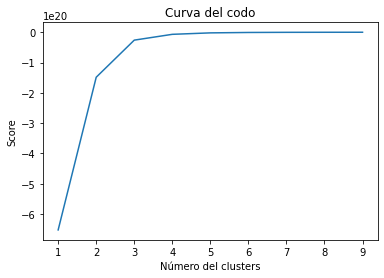

In [44]:
clustering_dataset['category_name'] = labelencoder.fit_transform(companies_NASDAQ_IPO['category_name'])

X = np.array(clustering_dataset[["status","milestones", "employees","count_investments","acquirements_USA"]])
y = np.array(clustering_dataset['category_name'])

N_clusters = range(1, 10)
kmeans = [KMeans(n_clusters=i) for i in N_clusters]
score = [kmeans[i].fit(X).score(X) for i in range(len(kmeans))]

plt.plot(N_clusters,score)
plt.xlabel('Número del clusters')
plt.ylabel('Score')
plt.title('Curva del codo')
plt.show()

Observando la curva del codo podemos determinar que el número óptimo de clusters es 3.

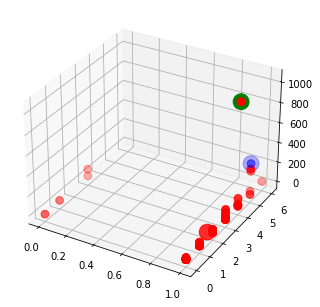

In [45]:
kmeans = KMeans(n_clusters=3).fit(X)
labels = kmeans.predict(X)

C = kmeans.cluster_centers_
colors=["red","green","blue"]
values=[]
for row in labels:
    values.append(colors[row])

fig = plt.figure()
ax = Axes3D(fig)
ax.scatter(X[:, 0], X[:, 1], X[:, 2], c=values,s=60)
ax.scatter(C[:, 0], C[:, 1], C[:, 2], marker='.', c=colors, s=1000)

Incorporamos el resultado de la claserización al conjunto de datos

In [46]:
clustering_dataset['Class']  = labels
clustering_dataset

,id,normalized_name,category_code,status,country_code,state_code,city,region,milestones,founded_at,...,category_business,category_manufacturing,category_other,acquirements_USA,acquirements_OTHERS,Symbol,Year,Year_Diff,acq_per_year,Class
0,c:10855,teletech,software,0,USA,CO,Englewood,Denver,1,1982-01-01,...,False,False,False,0.0,0.0,TTEC,1996,25,0.000000e+00,0
1,c:1105,wix,web,1,ISR,NaN,Tel Aviv,Tel Aviv,4,2006-01-01,...,False,False,False,0.0,0.0,WIX,2013,8,0.000000e+00,0
2,c:11082,f5 networks,other,1,USA,WA,Seattle,Seattle,2,1996-02-01,...,False,False,True,210000000.0,0.0,FFIV,1999,22,9.545455e+06,0
3,c:11391,groupon,web,1,USA,IL,Chicago,Chicago,3,2008-11-11,...,False,False,False,272700000.0,0.0,GRPN,2011,10,2.727000e+07,0
4,c:12394,commscope,hardware,1,USA,TX,Richardson,Dallas,2,1976-01-01,...,False,True,False,60000000.0,0.0,COMM,2013,8,7.500000e+06,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
216,c:9379,travelzoo,web,1,USA,NY,New York,New York,4,NaN,...,False,False,False,0.0,0.0,TZOO,2002,19,0.000000e+00,0
217,c:9389,zagg,hardware,1,USA,UT,Salt Lake City,Salt Lake City,1,NaN,...,False,True,False,105000000.0,0.0,ZAGG,2007,14,7.500000e+06,0
218,c:959,zillow,real_estate,1,USA,WA,Seattle,Seattle,4,2005-01-01,...,False,True,False,90000000.0,0.0,Z,2015,6,1.500000e+07,0
219,c:988,echostar,hardware,1,USA,CO,Englewood,Denver,3,1980-01-01,...,False,True,False,3393725.0,0.0,SATS,2007,14,2.424089e+05,0


Aqui podemos ver que el Algoritmo de K-Means con K=3 ha agrupado a las muestras por categoría, teniendo en cuenta las dimensiones que utilizamos: Employees, Count_investments y Acquirements

A continuación haremos 3 gráficas en 2 dimensiones con las proyecciones a partir de nuestra gráfica 3D para que nos ayude a visualizar los grupos y su clasificación:

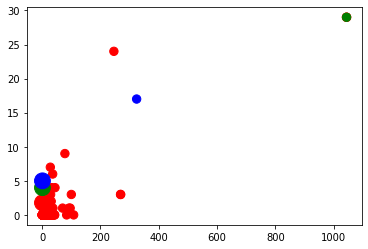

In [47]:
f1 = clustering_dataset["employees"].values
f2 = clustering_dataset["count_investments"].values

plt.scatter(f1, f2, c=values, s=70)
plt.scatter(C[:, 0], C[:, 1], marker='.', c=colors, s=1000)
plt.show()

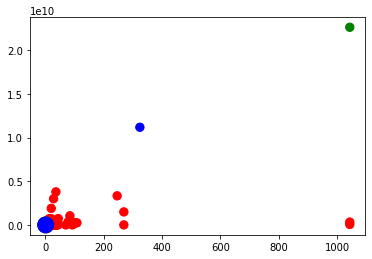

In [48]:
f1 = clustering_dataset["employees"].values
f2 = clustering_dataset["acquirements"].values

plt.scatter(f1, f2, c=values, s=70)
plt.scatter(C[:, 0], C[:, 1], marker='.', c=colors, s=1000)
plt.show()

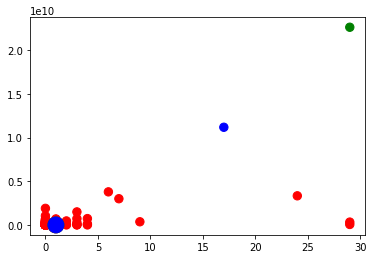

In [49]:
f1 = clustering_dataset["count_investments"].values
f2 = clustering_dataset["acquirements"].values

plt.scatter(f1, f2, c=values, s=70)
plt.scatter(C[:, 0], C[:, 1], marker='.', c=colors, s=1000)
plt.show()

## Rondas de financiación

In [50]:
funding_rounds = pd.read_csv('/kaggle/input/startup-investments/funding_rounds.csv')
funding_rounds = funding_rounds[['object_id', 'funding_round_type', 'raised_amount_usd','participants', 'is_first_round', 'is_last_round']]
funding_rounds.head()

,object_id,funding_round_type,raised_amount_usd,participants,is_first_round,is_last_round
0,c:4,series-b,8500000.0,2,0,0
1,c:5,angel,500000.0,2,0,1
2,c:5,series-a,12700000.0,3,0,0
3,c:5,series-b,27500000.0,4,0,0
4,c:7299,series-b,10500000.0,2,0,0


In [51]:
def get_binary_fund_type(data):
    type_venture = False
    type_angel = False
    type_series_a = False
    type_series_b = False
    type_series_cplus = False
    type_other = False
    type_private_equity = False
    type_crowdfunding = False
    type_post_ipo = False

    if data['funding_round_type'] == 'venture':
        type_venture = True
    elif data['funding_round_type'] == 'angel': 
        type_angel = True
    elif data['funding_round_type'] == 'series-a':   
        type_series_a = True
    elif data['funding_round_type'] == 'series-b':
        type_series_b = True
    elif data['funding_round_type'] == 'series-c+':
        type_series_cplus = True
    elif data['funding_round_type'] == 'other':
        type_other = True
    elif data['funding_round_type'] == 'private-equity':
        type_private_equity = True
    elif data['funding_round_type'] == 'crowdfunding':
        type_crowdfunding = True
    elif data['funding_round_type'] == 'post-ipo':
        type_post_ipo = True

    return pd.Series([type_venture,type_angel,type_series_a,type_series_b,type_series_cplus,
    type_other,type_private_equity,type_crowdfunding,type_post_ipo])


In [52]:
funding_rounds[['type_venture','type_angel','type_series_a','type_series_b','type_series_cplus'
,'type_other','type_private_equity','type_crowdfunding','type_post_ipo']] = funding_rounds.apply(get_binary_fund_type, axis=1)

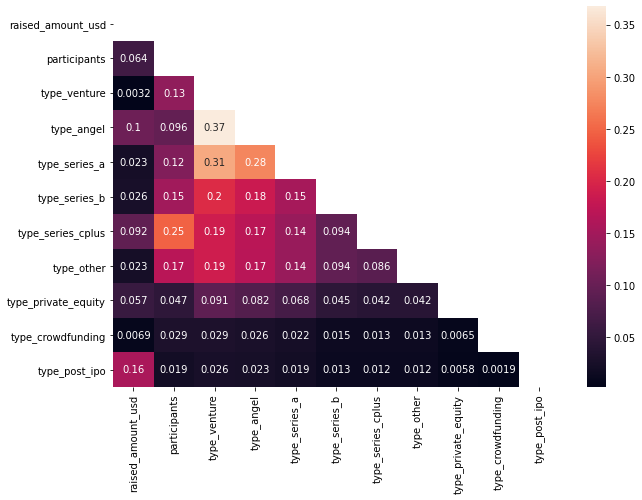

In [53]:
mat = funding_rounds[['raised_amount_usd','participants','type_venture','type_angel','type_series_a','type_series_b','type_series_cplus'
,'type_other','type_private_equity','type_crowdfunding','type_post_ipo']].corr().abs()

mask = np.triu(np.ones_like(mat, dtype=bool))
mat_masked = mat.mask(mask)  # Pone a NaN todo lo que aparezca como True en la máscara

fig, ax = plt.subplots(figsize=(10,7)) 
sns.heatmap(mat_masked, annot=True, ax=ax)
plt.show()

In [54]:
funding_rounds_grouped = funding_rounds.groupby('object_id')['raised_amount_usd'].sum().reset_index(name='raised_amount_usd_total')
funding_rounds_grouped.head()

,object_id,raised_amount_usd_total
0,c:1,39750000.0
1,c:1001,5000000.0
2,c:10014,0.0
3,c:10015,68069200.0
4,c:100155,10125293.0


In [55]:
funding_rounds_grouped = pd.merge(funding_rounds, funding_rounds_grouped, how="left", on=["object_id"])
funding_rounds_grouped['percentage'] = funding_rounds_grouped['raised_amount_usd'] / funding_rounds_grouped['raised_amount_usd_total']
funding_rounds_grouped.drop(columns=['raised_amount_usd_total'], inplace=True)
funding_rounds_grouped.head()

,object_id,funding_round_type,raised_amount_usd,participants,is_first_round,is_last_round,type_venture,type_angel,type_series_a,type_series_b,type_series_cplus,type_other,type_private_equity,type_crowdfunding,type_post_ipo,percentage
0,c:4,series-b,8500000.0,2,0,0,False,False,False,True,False,False,False,False,False,0.188889
1,c:5,angel,500000.0,2,0,1,False,True,False,False,False,False,False,False,False,0.000206
2,c:5,series-a,12700000.0,3,0,0,False,False,True,False,False,False,False,False,False,0.005236
3,c:5,series-b,27500000.0,4,0,0,False,False,False,True,False,False,False,False,False,0.011337
4,c:7299,series-b,10500000.0,2,0,0,False,False,False,True,False,False,False,False,False,0.311826


# 2 - Predicción del Rendimiento Futuro 

Importamos las librerías necesarias para esta parte:

In [56]:
from datetime import date
from dateutil.relativedelta import relativedelta
import re

In [57]:
# Cargamos los datos
datos = pd.read_csv('/kaggle/input/financial-ipo-data/IPODataFull.csv')
datos.head()

,Symbol,DaysBetterThanSP,daysProfit,daysProfitGrouped,exactDiffernce,Year,Month,Day,dayOfWeek,closeDay0,...,usableCEOAge,usableCEOGender,usablePresidentAge,usablePresidentGender,FoundingDateGrouped,yearDifferenceGrouped,Profitable,Safe,HomeRunDay,HomeRun
0,A,122,249,200+,NaN,1999,11,18,3,28.6358,...,Blank,Blank,Blank,Blank,1951 - 2000,Unknown,1,0,77.0,1
1,AAC,131,262,200+,232.0,2014,10,2,3,18.5000,...,40 - 49,male,Blank,Blank,2011 - present,Unknown,1,1,NaN,0
2,AAOI,125,262,200+,6054.0,2013,9,26,3,9.9600,...,Blank,Blank,Blank,Blank,1951 - 2000,Unknown,1,0,NaN,0
3,AAP,128,261,200+,NaN,2001,11,29,3,13.9000,...,Blank,Blank,Blank,Blank,1901 - 1950,Unknown,1,0,NaN,0
4,AAT,123,127,100 - 149,181.0,2011,1,13,3,21.2500,...,Blank,Blank,Blank,Blank,2001 - 2010,Unknown,0,0,NaN,0


In [58]:
datos.shape

(3762, 1664)

Tenemos un dataset con 3762 empresas y 1664 columnas - muchas de ellas representan datos históricos (como precio de inicio, cierre, volumen...) que emplearemos en la exploración de datos.

### Preproceso

Comenzamos comprobando si tenemos alguna empresa duplicada:

In [59]:
datos['Symbol'].duplicated().sum()

63

Vemos que hay 63 duplicidades (la empresa `MITT` está duplicada, por lo que eliminamos sus copias).

In [60]:
datos.drop_duplicates(subset=['Symbol'], inplace = True)

Listamos las columnas, el número de valores únicos para estas y los valores nulos:

In [61]:
datos.columns

Index(['Symbol', 'DaysBetterThanSP', 'daysProfit', 'daysProfitGrouped',
       'exactDiffernce', 'Year', 'Month', 'Day', 'dayOfWeek', 'closeDay0',
       ...
       'usableCEOAge', 'usableCEOGender', 'usablePresidentAge',
       'usablePresidentGender', 'FoundingDateGrouped', 'yearDifferenceGrouped',
       'Profitable', 'Safe', 'HomeRunDay', 'HomeRun'],
      dtype='object', length=1664)

In [62]:
datos.nunique(axis=0)

Symbol                   3699
DaysBetterThanSP          153
daysProfit                263
daysProfitGrouped           5
exactDiffernce           1261
                         ... 
yearDifferenceGrouped       1
Profitable                  2
Safe                        2
HomeRunDay                163
HomeRun                     2
Length: 1664, dtype: int64

In [63]:
datos.isnull().sum()

Symbol                      0
DaysBetterThanSP            0
daysProfit                  0
daysProfitGrouped           0
exactDiffernce           2131
                         ... 
yearDifferenceGrouped       0
Profitable                  0
Safe                        0
HomeRunDay               3438
HomeRun                     0
Length: 1664, dtype: int64

Podemos observar como hay una gran cantidad de valores vacíos en la matriz de datos. En lugar de eliminarlos todos, iremos desechando aquellos de los que podamos prescindir sin influenciar en el rendimiento del predictor.

Trasponemos la matriz para trabajar sobre las columnas como índice, lo que nos facilitará el preprocesamiento en algunos casos:

In [64]:
datos_t = datos.transpose().copy()
datos_t.reset_index(inplace = True)
datos_t.rename(columns={'index':'variable'}, inplace = True)
datos_t.head(3)

,variable,0,1,2,3,4,5,6,7,8,...,3752,3753,3754,3755,3756,3757,3758,3759,3760,3761
0,Symbol,A,AAC,AAOI,AAP,AAT,AAV,AAWW,AAXJ,ABAC,...,ZOES,ZS,ZSAN,ZTO,ZTS,ZUMZ,ZUO,ZX,ZYME,ZYNE
1,DaysBetterThanSP,122,131,125,128,123,76,96,125,103,...,126,9,108,135,115,139,5,102,115,104
2,daysProfit,249,262,262,261,127,1,224,0,72,...,261,26,30,3,226,261,7,25,19,42


Combinamos los campos de fecha para obtener una columna que nos permita operar sobre campos temporales:

In [65]:
mask = datos_t[datos_t['variable'].isin(['Year', 'Month', 'Day'])]
# Añadimos un DF auxiliar
d = {'variable':['date']}
df_dates = pd.DataFrame(d)
# Iteramos para añadir las fechas
for i in mask.columns[1:]:
    year = mask.loc[4,i]
    month = mask.loc[5, i]
    day = mask.loc[6, i]
    df_dates[i] = pd.to_datetime(str(year)+'-'+str(month)+'-'+str(day))
    
# Juntamos los DFs
datos_t = datos_t.append(df_dates, ignore_index = True)
datos_t

KeyError: 4

Vamos a añadir el precio de la acción para cada compañía 3 meses después de su primer año en bolsa. Con esto podremos obtener la variación porcentual del valor de su acción, que servirá como variable objetivo a la hora de realizar las predicciones:

In [66]:
# DF auxiliar para guardar los valores
##### Kaggle no soporta la librería ####
"""
d = {'variable':['stockprice3m']}
stock3m = pd.DataFrame(d)

for i in datos_t.columns[1:]:
    try:
        
        date = datos_t.loc[1663, i]
        date3t = date + pd.DateOffset(months=15)
        # Objeto Ticker de yfinance para obtener cotizaciones históricas
        ticker = yf.Ticker(i)
        df_temp = ticker.history(start = date, end = date3t)
        # La última fecha disponible para el precio 
        stockprice = df_temp.loc[df_temp.index.max(),'Close']
        stock3m[i] = stockprice
# Si la librería no es capaz de encontrar los valores, devuelve un NaN
    except: 
        stock3m[i] = np.nan
        
# Unimos los DFs
datos_t = datos_t.append(stock3m)
# Guardamos los datos 
datos_t.to_csv('datostprecio3m.csv', sep=';')
"""

"\nd = {'variable':['stockprice3m']}\nstock3m = pd.DataFrame(d)\n\nfor i in datos_t.columns[1:]:\n    try:\n        \n        date = datos_t.loc[1663, i]\n        date3t = date + pd.DateOffset(months=15)\n        # Objeto Ticker de yfinance para obtener cotizaciones históricas\n        ticker = yf.Ticker(i)\n        df_temp = ticker.history(start = date, end = date3t)\n        # La última fecha disponible para el precio \n        stockprice = df_temp.loc[df_temp.index.max(),'Close']\n        stock3m[i] = stockprice\n# Si la librería no es capaz de encontrar los valores, devuelve un NaN\n    except: \n        stock3m[i] = np.nan\n        \n# Unimos los DFs\ndatos_t = datos_t.append(stock3m)\n# Guardamos los datos \ndatos_t.to_csv('datostprecio3m.csv', sep=';')\n"

In [67]:
datos_t =pd.read_csv('')

FileNotFoundError: [Errno 2] No such file or directory: ''

Comprobamos cuántos precios finales hemos sido capaces de obtener

In [68]:
datos_t[datos_t['variable']=='stockprice3m'].count().sum(axis = 0)

0

Eliminamos las que no tengan precio en el periodo final

In [69]:
drop = []
for i in datos_t.columns[1:]:
    if datos_t[datos_t['variable']=='stockprice3m'][i].isnull().values.any():
        drop.append(i)

len(drop)

0

In [70]:
datos_t.drop(drop, axis = 1, inplace = True)

Calculamos la variación de los 3 meses siguientes tras 1 año después de la IPO. Dado que algunas compañías no tienen precios de los últimos días, consideramos como máximo el día 255 para considerarlas como válidas.

In [71]:
df_temp = pd.DataFrame({'variable':['variation']})
datos_t.set_index('variable', inplace = True)
for i in datos_t.columns:
    for j in ['closeDay261', 'closeDay260', 'closeDay259', 'closeDay258', 'closeDay257', 'closeDay256', 'closeDay255']:
        b = False
        if datos_t.loc[j, i] != np.nan and b == False:
            df_temp[i] = (float(datos_t.loc['stockprice3m', i]) - float(datos_t.loc[j, i])) / float(datos_t.loc[j, i])
            b = True
            
# Contamos los que no están vacíos            
df_temp.count().sum(axis = 0)

KeyError: 'stockprice3m'

Unimos los datos

In [72]:
datos_t.reset_index(inplace = True)
datos_t = datos_t.append(df_temp)
datos_t.reset_index(drop = True, inplace = True)
datos_t

,variable,0,1,2,3,4,5,6,7,8,...,3752,3753,3754,3755,3756,3757,3758,3759,3760,3761
0,Symbol,A,AAC,AAOI,AAP,AAT,AAV,AAWW,AAXJ,ABAC,...,ZOES,ZS,ZSAN,ZTO,ZTS,ZUMZ,ZUO,ZX,ZYME,ZYNE
1,DaysBetterThanSP,122,131,125,128,123,76,96,125,103,...,126,9,108,135,115,139,5,102,115,104
2,daysProfit,249,262,262,261,127,1,224,0,72,...,261,26,30,3,226,261,7,25,19,42
3,daysProfitGrouped,200+,200+,200+,200+,100 - 149,0 - 49,200+,0 - 49,50 - 99,...,200+,0 - 49,0 - 49,0 - 49,200+,200+,0 - 49,0 - 49,0 - 49,0 - 49
4,exactDiffernce,NaN,232.0,6054.0,NaN,181.0,1614.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1035.0,NaN,3108.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1660,Profitable,1,1,1,1,0,0,1,0,0,...,1,0,0,0,1,1,0,0,0,0
1661,Safe,0,1,0,0,0,0,0,0,0,...,0,0,0,1,0,1,0,0,0,0
1662,HomeRunDay,77.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,234.0,NaN,NaN,NaN,NaN
1663,HomeRun,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0


Desechamos los que tengan NaN en la variación

In [73]:
drop = []
for i in datos_t.columns[1:]:
    if datos_t[datos_t['variable']=='stockprice3m'][i].isnull().values.any():
        drop.append(i)

len(drop)

datos_t.drop(drop, axis = 1, inplace = True)
datos_t.set_index('variable', inplace = True)

In [74]:
# Volvemos a trasponer los datos para tratar las columnas como variables y las filas como empresas:
variacion = datos_t.transpose()

Llegados a este punto, vamos a asegurar la calidad de los datos eliminando las empresas que no cumplan estos parámetros:

1. Que tengan datos de empleados
2. Que tengan datos de capitalización de mercado
3. Que presenten ingresos y beneficios netos
4. Que cuenten con año de fundación

In [75]:
# En ocasiones, aparece '-' como dato de empleados
variacion['employees'] = variacion['employees'].replace('-', np.nan)
variacion['employees'] = variacion['employees'].replace('0', np.nan)
variacion.dropna(subset=['employees'], inplace = True)

In [76]:
# Compañias sin capitalización total de mercado
variacion['MarketCap'] = variacion['MarketCap'].replace('0.0', np.nan)
variacion.dropna(subset=['MarketCap'], inplace = True)

In [77]:
# Companías que no presentan ingresos, beneficios y año de fundación
variacion.dropna(subset=['Revenue'], inplace = True)
variacion.dropna(subset=['netIncome'], inplace = True)
variacion.dropna(subset=['YearFounded'], inplace = True)

Los valores monetarios están representados en formato String, con una B o una M en ocasiones para indicar la magnitud de los ingresos o capitalizaciones. Para solventar esto, creamos una función auxiliar que formatee correctamente los datos

In [78]:
# Diccionario para formatear los números
dval = {'M': 1000000, 'B': 1000000000}

# Función auxiliar para formatear
def format_currency(x):
    nodollar = x.replace('$', '')
    dollar = re.findall(r'[-,0-9,\.,\,]+', nodollar)
    magnitude = re.split(r'[-,0-9,\.,\,]+', nodollar)
    dollar = dollar[0].replace(',','')
    if magnitude[-1] in ['B', 'M']:
        return float(dollar) * dval[magnitude[-1]]
    else:
        return float(dollar)

In [79]:
variacion['Revenue'] = variacion['Revenue'].apply(format_currency)
variacion['netIncome'] = variacion['netIncome'].apply(format_currency)

Guardamos los datos filtrados para emplearlos posteriormente

In [80]:
variacion.to_csv('empfiltradas.csv', sep=';')

Eliminamos en este punto los datos de las operaciones intra diarias, ya que no los emplearemos en la predicción

In [81]:
dropcol = []
for i in range(262):
    dropcol += ['openDay'+str(i), 'highDay'+str(i), 'volumeDay'+str(i), 'lowDay'+str(i)]
    
variacion.drop(dropcol, axis = 'columns', inplace = True)

Vamos a crear columnas que representen la variación mensual del precio de la acción. Como las acciones sólo cotizan en días laborables, para un año tenemos 262 valores en lugar de 365. Por ello, definimos los meses como periodos de 22 días.

Para el último mes, emplearemos el último dato de cierre como precio final, ya que hay algunas empresas que cuentan con NaN en los últimos días del dataset. 

In [82]:
closecols = ['closeDay'+str(i) for i in range(262)]
variacion[closecols] = variacion[closecols].astype(float)
variacion[closecols].isna().sum().to_dict()

{'closeDay0': 0,
 'closeDay1': 0,
 'closeDay2': 0,
 'closeDay3': 0,
 'closeDay4': 0,
 'closeDay5': 0,
 'closeDay6': 0,
 'closeDay7': 1,
 'closeDay8': 1,
 'closeDay9': 1,
 'closeDay10': 1,
 'closeDay11': 1,
 'closeDay12': 1,
 'closeDay13': 1,
 'closeDay14': 1,
 'closeDay15': 1,
 'closeDay16': 1,
 'closeDay17': 3,
 'closeDay18': 4,
 'closeDay19': 6,
 'closeDay20': 6,
 'closeDay21': 7,
 'closeDay22': 7,
 'closeDay23': 7,
 'closeDay24': 7,
 'closeDay25': 8,
 'closeDay26': 9,
 'closeDay27': 10,
 'closeDay28': 11,
 'closeDay29': 11,
 'closeDay30': 12,
 'closeDay31': 12,
 'closeDay32': 12,
 'closeDay33': 12,
 'closeDay34': 12,
 'closeDay35': 12,
 'closeDay36': 12,
 'closeDay37': 12,
 'closeDay38': 12,
 'closeDay39': 12,
 'closeDay40': 12,
 'closeDay41': 12,
 'closeDay42': 12,
 'closeDay43': 12,
 'closeDay44': 12,
 'closeDay45': 12,
 'closeDay46': 12,
 'closeDay47': 12,
 'closeDay48': 12,
 'closeDay49': 12,
 'closeDay50': 12,
 'closeDay51': 14,
 'closeDay52': 16,
 'closeDay53': 16,
 'closeDay5

Creamos la variación de los 11 primeros meses:

In [83]:
for i in range(11):
    if i < 11:
        variacion['after'+str(i+1)+'m'] = (variacion['closeDay'+str((i+1)*22)] - variacion['closeDay'+str((i)*22)]) / variacion['closeDay'+str((i)*22)]
    else: 
        variacion['after'+str(i+1)+'m'] = (variacion['closeDay'+str((i+1)*19)] - variacion['closeDay'+str((i)*22)]) / variacion['closeDay'+str((i)*22)]

Creamos la variación del último mes del stock. Como máximo, consideramos el día 256 de tradeo de la acción:

In [84]:
for inc in variacion.index:
    pause = False
    for lastday in ['closeDay261', 'closeDay260', 'closeDay259', 'closeDay258', 'closeDay257', 'closeDay256', 'closeDay255']:
        if pause == False and variacion.loc[inc, lastday] != np.nan:
            variacion.loc[inc, 'after12m'] = (variacion.loc[inc, lastday] - variacion.loc[inc, 'closeDay242']) / variacion.loc[inc, 'closeDay242']
            
variacion[variacion.columns[-12:]].isna().sum()

variable
after1m      7
after2m     12
after3m     23
after4m     25
after5m     31
after6m     51
after7m     59
after8m     61
after9m     70
after10m    81
after11m    90
after12m    97
dtype: int64

No obtenemos ningún NaN, por lo que continuamos.

Procedemos a eliminar las columnas de cierre, ya que ya nos las vamos a emplear:

In [85]:
df = variacion.drop(closecols, axis = 'columns')

Seleccionamos las columnas finales que emplearemos en la predicción. Estas son:

* `DaysBetterThenSP`: Días en los que el stock superó al índice S&P500 en rendimiento.
* `daysProfit`: Días en los que el stock mostró un rendimiento positivo.
* `Year`: Año de salida a bolsa.
* `Month`: Mes de salida a bolsa.
* `Day`: Día de salida a bolsa.
* `dayOfWeek`: Día de la semana de salida a bolsa (del 1 al 5).
* `LastSale`: Número de acciones vendidas en la IPO.
* `MarketCap`: Capitalización bursátil tras la IPO.
* `Sector`: Sector de actividad.
* `Revenue`: Ingresos en el primer año tras la IPO.
* `netIncome`: Beneficio neto en el primer año tras la IPO.
* `employees`: Número de empleados de la empresa.
* `USACompany`: Si la empresa es de EEUU (Yes / No).
* `YearFounded`: Año en el que se fundó la empresa.
* `Profitable`: Si la IPO consiguió beneficios sobre el precio de salida.
* `Homerun`: Si el stock mostró un rendimiento excepcional en su primer año. 
* `Safe`: Si la IPO fue de tipo Safe.

Además, se incluyen las variables creadas por nosotros, representando las variaciones totales y mensuales.


In [86]:
selectedcols = ['DaysBetterThanSP', 'daysProfit', 'Year', 'Month', 'Day', 'dayOfWeek', 'LastSale', 
'MarketCap', 'Sector', 'ipoDate', 'Revenue', 'USACompany', 'netIncome', 'employees', 'YearFounded', 'Profitable',
'Safe', 'HomeRun', 'variation', 'after1m',  'after2m',
'after3m', 'after4m', 'after5m', 'after6m', 
'after7m', 'after8m', 'after9m', 'after10m', 
'after11m', 'after12m']

datos_final = df[selectedcols]
datos_final.dtypes

variable
DaysBetterThanSP     object
daysProfit           object
Year                 object
Month                object
Day                  object
dayOfWeek            object
LastSale             object
MarketCap            object
Sector               object
ipoDate              object
Revenue             float64
USACompany           object
netIncome           float64
employees            object
YearFounded          object
Profitable           object
Safe                 object
HomeRun              object
variation            object
after1m             float64
after2m             float64
after3m             float64
after4m             float64
after5m             float64
after6m             float64
after7m             float64
after8m             float64
after9m             float64
after10m            float64
after11m            float64
after12m            float64
dtype: object

Casteamos las columnas numéricas a float

In [87]:
# We convert all those variables to float
tocast = ['DaysBetterThanSP', 'daysProfit', 'Year', 'Month', 'Day', 'LastSale', 
'MarketCap', 'Revenue', 'netIncome', 'employees', 'YearFounded', 'Profitable',
'Safe', 'HomeRun', 'variation', 'after1m',  'after2m',
'after3m', 'after4m', 'after5m', 'after6m', 
'after7m', 'after8m', 'after9m', 'after10m', 
'after11m', 'after12m']
datos_final[tocast] = datos_final[tocast].astype(float)
datos_final.dtypes

variable
DaysBetterThanSP    float64
daysProfit          float64
Year                float64
Month               float64
Day                 float64
dayOfWeek            object
LastSale            float64
MarketCap           float64
Sector               object
ipoDate              object
Revenue             float64
USACompany           object
netIncome           float64
employees           float64
YearFounded         float64
Profitable          float64
Safe                float64
HomeRun             float64
variation           float64
after1m             float64
after2m             float64
after3m             float64
after4m             float64
after5m             float64
after6m             float64
after7m             float64
after8m             float64
after9m             float64
after10m            float64
after11m            float64
after12m            float64
dtype: object

Calculamos la diferencia en años entre la fundación de la empresa y su salida a bolsa

In [88]:
datos_final['diffpublic'] = datos_final['Year'] - datos_final['YearFounded'] 
datos_final.drop(['YearFounded', 'ipoDate'], inplace = True, axis = 'columns')

Agrupamos los sectores según el mismo criterio empleado en el análisis de mercado:

In [89]:
dsector = {np.nan: 'other', 'Transportation':'services', 'Energy':'services', 'Public Utilities':'services', 
            'Consumer Non-Durables':'other', 'Miscellaneous':'other', 'Basic Industries':'manufacturing',
            'Finance': 'business', 'Consumer Durables':'manufacturing', 'Health Care':'services', 'Consumer Services':'services', 'Consumer Non-Durables':'other',
            'Technology':'technology', 'Capital Goods':'manufacturing'}
datos_final['Sector'].replace(dsector, inplace = True)
datos_final['Sector'].unique()

array(['manufacturing', 'services', 'technology', 'other', 'business'],
      dtype=object)

Para clasificar las empresas, vamos a observar la distribución de su rendimiento en el primer trimestre después de su primer año siendo públicas. 

In [90]:
datos_final['variation'].describe()

count    0.0
mean     NaN
std      NaN
min      NaN
25%      NaN
50%      NaN
75%      NaN
max      NaN
Name: variation, dtype: float64

Vemos que la mediana está en -10% de rentabilidad. 

In [91]:
datos_final[datos_final['variation'] >0]['variation'].describe()

count    0.0
mean     NaN
std      NaN
min      NaN
25%      NaN
50%      NaN
75%      NaN
max      NaN
Name: variation, dtype: float64

En este caso, la mediana de las positivas está en 20% tras 3 meses, por lo que las que tengan una rentabilidad superior a esta serán clasificadas como con rendimiento bueno. 

In [92]:
datos_final['performance'] = 'negative'
mask = datos_final[datos_final['variation'] > 0] 
datos_final.loc[mask.index, 'performance'] = 'positive'
mask = datos_final[datos_final['variation'] > 0.2]
datos_final.loc[mask.index, 'performance'] = 'good'

In [93]:
datos_final['performance'].value_counts()

negative    2326
Name: performance, dtype: int64

Guardamos los datos:

In [94]:
datos_final.to_csv('datapred.csv', sep=';')

# 3 - Predicción: Clasificación y regresión

Librerías para esta parte:

In [95]:
# Clasificación 
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC

# Selección
from sklearn.model_selection import KFold 
from sklearn.model_selection import RepeatedKFold
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import f1_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
from sklearn.metrics import auc
from sklearn.model_selection import cross_val_score
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier

# Visualización
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns

In [96]:
data = datos_final.copy()
data.columns

Index(['DaysBetterThanSP', 'daysProfit', 'Year', 'Month', 'Day', 'dayOfWeek',
       'LastSale', 'MarketCap', 'Sector', 'Revenue', 'USACompany', 'netIncome',
       'employees', 'Profitable', 'Safe', 'HomeRun', 'variation', 'after1m',
       'after2m', 'after3m', 'after4m', 'after5m', 'after6m', 'after7m',
       'after8m', 'after9m', 'after10m', 'after11m', 'after12m', 'diffpublic',
       'performance'],
      dtype='object', name='variable')

In [97]:
# Funciñon auxiliar para comparar resultados
def resultados_class(modelo, y, x):
    pred = modelo.predict(x)
    acc = accuracy_score(y, pred)
    f1 =  f1_score(y, pred, average='macro')

    results = {
        'Precision': acc,
        'F1-Score': f1,
    }

    # Classification Report
    print(classification_report(y, pred))

    # Matrices de confusión
    cnftot = plot_confusion_matrix(modelo, x, y)
    cnftot.ax_.set_title('Matriz de Confusión Absoluta')
    cnfacc = plot_confusion_matrix(modelo, x, y, normalize='pred')
    cnfacc.ax_.set_title('Matriz de Confusión (%True)')

    return results

# Función auxiliar para transformar los datos categoricos en One  Hot
 def get_add_onehot(column, data):
    one = OneHotEncoder(drop = 'first')
    onehot = one.fit_transform(data[column].values.reshape(-1,1)).toarray()
    dfOneHot = pd.DataFrame(onehot, columns = [str(column)+str(int(i)) for i in range(onehot.shape[1])])
    data = pd.concat([data, dfOneHot], axis=1)
    data.drop([column], axis=1, inplace = True) 

    return data

IndentationError: unindent does not match any outer indentation level (<tokenize>, line 24)

Reseteamos el índice y transformamos las variables categóricas:

In [99]:
data.reset_index(inplace = True)
for i in ['dayOfWeek', 'Sector']:
    data = get_add_onehot(i, data)

NameError: name 'get_add_onehot' is not defined

Cambiamos también la variable `USACompany` a tipo binaria:

In [100]:
data['USACompany'] = label_binarize(data['USACompany'], classes = ['No', 'Yes'])

NameError: name 'label_binarize' is not defined

Tras comprobar los rendimientos de los datos, hemos visto que hay empresas cuyos datos de precios en el dataset original no coinciden con los reales, lo que les lleva a formar outliers en el rendimiento. Por ello, vamos a eliminar las empresas que tienen un rendimiento superior al 1,000%, puesto que las consideraremos outliers.

In [101]:
mask = data[data['variation'] > 10]
data.drop(mask.index, axis = 'rows', inplace = True)
data.reset_index(drop = True, inplace= True)
data.shape

(2326, 32)

Creamos la lista de predictores y dividimos el dataset entre train y test:

In [102]:
predictors = data.drop(['index', 'variation', 'performance'], axis = 1).columns.tolist()
seed = 0

train, test = train_test_split(data, test_size = 0.2, random_state = seed)

x_train = train[predictors]
y_train = train['performance']
x_test = test[predictors]
y_test = test['performance']

NameError: name 'train_test_split' is not defined

### NB Gausiano

Comenzamos implementando esta sencilla variación del NB que nos servirá como baseline:

In [103]:
%%time
modelo = GaussianNB()
modelo.fit(x_train, y_train)

NameError: name 'x_train' is not defined

In [104]:
resultados_class(modelo, y_train, x_train)

NameError: name 'resultados_class' is not defined

El rendimiento no es muy bueno, por lo que probamos a transformar los datos:

In [105]:
modelo2 = GaussianNB()
scaler = MinMaxScaler()
aux = pd.DataFrame(scaler.fit_transform(x_train), columns = x_train.columns)
modelo2.fit(aux, y_train)
resultados_class(modelo2, y_train, aux)

NameError: name 'MinMaxScaler' is not defined

No conseguimos mejorar el rendimiento, por lo que pasamos al siguiente modelo

### KNN

Implantamos un modelo KNN de clasificación. Para buscar los mejores hiperparámetros, realizaremos un `GridSearch`.

In [106]:
# Número de vecinos:
k = np.arange(1, 30)

# Número de observaciones a considerar:
leafs = np.array([20, 30, 40, 50])

# Tipo de distancia:
p = np.array([1, 2])

# Creamos el diccionario que empleará GridSearchCV:
hparams = dict(n_neighbors = k, 
               leaf_size = leafs, 
               p = p)

In [107]:
# Declaramos la búsqueda de hiperparámetros con CV = 5:
search = GridSearchCV(knn, hparams, cv = 5, verbose = 1, scoring = 'f1_weighted')
# Buscamos los parámetros del modelo:
best_knn = search.fit(x_train, y_train)

NameError: name 'knn' is not defined

In [108]:
# Comprobamos los parámetros ideales:
print('Leaf_size:', best_knn.best_estimator_.get_params()['leaf_size'])
print('P:', best_knn.best_estimator_.get_params()['p'])
print('N_neighbors:', best_knn.best_estimator_.get_params()['n_neighbors'])

NameError: name 'best_knn' is not defined

In [109]:
%%time
# Declaramos el modelo
knn = KNeighborsClassifier(n_neighbors = 14, leaf_size = 20, p = 2)
knn.fit(x_train, y_train)

NameError: name 'x_train' is not defined

In [110]:
# Lo evaluamos frente a los datos de entrenamiento:
resultados_class(knn, y_train, x_train)

NameError: name 'resultados_class' is not defined

In [111]:
resultados_knn = resultados_class(knn, y_test, x_test)

NameError: name 'resultados_class' is not defined

### SVC

De manera similar, proponemos unos hiperparámetros para encontrar el mejor modelo posible:

In [112]:
hparams = {
    'kernel': ['linear', 'rbf', 'sigmoid'],
    'class_weight': [None, 'balanced']
}
svc = SVC()

search = GridSearchCV(svc, hparams, cv = 10, scoring = 'f1_weighted')

In [113]:
# Declaramos el escalador
escalador = StandardScaler()

# Escalamos las variables predictoras
x_train_e = escalador.fit_transform(x_train)
x_test_e = escalador.fit_transform(x_test)
best_svc = search.fit(x_train_e, y_train)

NameError: name 'StandardScaler' is not defined

In [114]:
best_svc.best_params_

NameError: name 'best_svc' is not defined

In [115]:
svc = SVC(kernel = 'sigmoid', probability=True)
svc.fit(x_train_e, y_train)
resultados_class(svc, y_train, x_train_e)

NameError: name 'x_train_e' is not defined

Observamos unos resultados peores que los ofrecidos por KNN en el conjunto train. Probamos para test:

In [116]:
resultados_svc = resultados_class(svc, y_test, x_test_e)

NameError: name 'resultados_class' is not defined

### RandomForest

Proponemos ahora una agrupación de DTs para clasificar el tipo de rendimiento de cada stock

In [117]:
# Instanciamos el modelo

rforest = RandomForestClassifier()

# Generamos el diccionario para la búsqueda de los hiperparámetros óptimos:

hparams = {
    'min_samples_split': np.arange(2, 40, 1), # Número mínimo de observaciones para dividir
    'max_features': ['sqrt', 'log2', 5] # Máximas columnas a considerar
}

In [118]:
search = GridSearchCV(rforest, hparams, cv = 5, scoring = 'f1_weighted')
search.fit(x_train, y_train)

NameError: name 'x_train' is not defined

In [119]:
print(search.best_score_)
search.best_params_

AttributeError: 'GridSearchCV' object has no attribute 'best_score_'

Instanciamos con los parámetros óptimos y probamos en el conjunto train:

In [120]:
rforest = RandomForestClassifier(max_features='sqrt', min_samples_split=3)
rforest.fit(x_train, y_train)
resultados_class(rforest, y_train, x_train)

NameError: name 'x_train' is not defined

En este caso obtenemos una clasificación perfecta, lo que puede significar que estamos cometiendo overfitting. Probamos en el conjunto test para asegurarnos:

In [121]:
resultado_rforest = resultados_class(rforest, y_test, x_test)

NameError: name 'resultados_class' is not defined

### NLPClassifier

Vamos a crear una pequeña red neuronal como clasificador utilizando la clase `NLPClassifier` de sklearn. Utilizaremos los datos transformados, como en el SVC. 

In [122]:
clf = MLPClassifier(hidden_layer_sizes = (128, 64, 24),random_state=1, max_iter=1000).fit(x_train_e, y_train)

NameError: name 'x_train_e' is not defined

In [123]:
resultados_class(clf, y_train, x_train_e)

NameError: name 'resultados_class' is not defined

En este caso también obtenemos una clasificación perfecta. Probamos en el conjunto test:

In [124]:
nn = resultados_class(clf, y_test, x_test_e)

NameError: name 'resultados_class' is not defined

### AdaBoost

Pasamos a probar otro emsemble, el Adaboost:

In [125]:
clf = AdaBoostClassifier(n_estimators=100, random_state=0)
clf.fit(x_train_e, y_train)
resultados_class(clf, y_train, x_train_e)

NameError: name 'x_train_e' is not defined

En principio, obtenemos resultados prometedores, sin síntomas ya de overfitting.

In [126]:
ada = resultados_class(clf, y_test, x_test_e)

NameError: name 'resultados_class' is not defined

### Comparación de Resultados

Observamos como el RandomForest es el modelo que mejor predice el conjunto test:

In [127]:
ddatos = {'KNN': resultados_knn.values(),
        'SVC': resultados_svc.values(),
         'RandomForest': resultado_rforest.values(),
         'NLP':nn.values(),
         'AdaBoost':ada.values()}

resultados = pd.DataFrame.from_dict(ddatos,
                                    orient = 'index',
                                    columns = resultados_knn.keys())  

NameError: name 'resultados_knn' is not defined

### Clasificación

Como el RandomForest ha sido el algoritmo que mejor nos ha funcionado en el conjunto test, lo vamos a emplear para predecir la clase de las empresas. Obtendremos, además, las probabilidades de pertenencia a cada clase - esto nos permitirá realizar un modelo individual para las más prometedoras:

In [128]:
df = pd.DataFrame(rforest.predict_proba(escalador.fit_transform(data[predictors])), columns = ['p_good', 'p_negative', 'p_positive'])
data['pred'] = rforest.predict(escalador.fit_transform(data[predictors]))
data = pd.concat([data, df], axis = 'columns')

NameError: name 'escalador' is not defined

In [129]:
data.sort_values('p_good', ascending = False).head()

KeyError: 'p_good'